# I. Overview

Describe the objective of this assignment. You can briefly state how you accompilsh it.

- Based on the Maze problem and the Poker Problem, learn the theory and application of reinforcement learning.

- The action was chosen by greedy stratage, and follow Q-learning and SARSA to realize the reinforcement learning process.

- The One-Card Poker is mroe interesting and challenging then Maze, with this part, I get a deeper understaning of reinforcement learning.

# II. Problems 

## A. Maze Problem (Practice)

Describe the problem. Read the following code and explain the GridWorld environment.


### Description of maze problem

The maze proble is finding the shortest way from the starting point to the goal point in a map. The map has its bundary, wall or obstacles, and open places. 

In the maze problem, we can summarize the state, action and reward below:
- State: tuple(location) in the grid map.

- Action: four actions (left, right, up, and down)

- Reward:
    reaches a goal--> +30;
    falls in a hole or moves out of the grid world --> -5;
    each move --> -1


### Explain the GridWorld

- The GridWorld defines the map, the action and reward. The map is read from the grid.txt. and in this txt file, it defines a matrix, which contains three characters, 'O', 'H', and 'G'.
    
    'O': open space;
    'H': Wall or obstacles;
    'G': Goal location

- The four actions (left, right, up, and down) is implemented by 

    
    self._actions = [[0, -1], [0, 1], [-1, 0], [1, 0]]


- In the function of check_state(self, s), we check whether it is in the map or not, if it cross the boundry and go outside of the map, it will return 'N'
 
 
    def check_state(self, s):
            if s[0] < 0 or s[1] < 0 or\
               s[0] >= self._size[0] or s[1] >= self._size[1]:
                return 'N'
            return self._map[tuple(s)].upper()
        else:
            return 'F'  # wrong input

- In the function next(self, a), it defines the reward and panalty.


    def next(self, a):
        s1 = self._s + self._actions[a]
        curr = self.check_state(s1)
        
        if curr == 'H' or curr == 'N':
            return -5
        elif curr == 'F':
            warnings.warn("invalid state " + str(s1))
            return -5
        elif curr == 'G':
            self._s = s1
            return 30
        else:
            self._s = s1
            return -1

- In the is_goal function, it defines the target which is G    
 
 
    def is_goal(self):
        return self.check_state(self._s) == 'G'
            

In [1]:
import collections
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Sample Grid Environment File

Simple text file with three characters, 'O', 'H', and 'G'.
- 'O': open space
- 'H': Wall or obstacles
- 'G': Goal location 

In [2]:
%%bash 
cat grid.txt

OOOHOOOOO
OOOHOOHOO
OOOOOOHOO
OOOOHHHOO
OOHOOOOOH
OOHOOOGOO
OOOOOOOOO

### GridWorld Class


In [18]:
# maze example

class GridWorld:
    """ Grid World environment
            there are four actions (left, right, up, and down) to move an agent
            In a grid, if it reaches a goal, it get 30 points of reward.
            If it falls in a hole or moves out of the grid world, it gets -5.
            Each step costs -1 point. 

        to test GridWorld, run the following sample codes:

            env = GridWorld('grid.txt')

            env.print_map()
            print [2,3], env.check_state([2,3])
            print [0,0], env.check_state([0,0])
            print [3,4], env.check_state([3,4])
            print [10,3], env.check_state([10,3])

            env.init([0,0])
            print env.next(1)  # right
            print env.next(3)  # down
            print env.next(0)  # left
            print env.next(2)  # up
            print env.next(2)  # up

        Parameters
        ==========
        _map        ndarray
                    string array read from a file input
        _size       1d array
                    the size of _map in ndarray
        goal_pos    tuple
                    the index for the goal location
        _actions    list
                    list of actions for 4 actions
        _s          1d array
                    current state
    """
    def __init__(self, fn):
        # read a map from a file
        self._map = self.read_map(fn)
        # map size
        self._size = np.asarray(self._map.shape)
        # goal
        self.goal_pos = np.where(self._map == 'G')

        # definition of actions (left, right, up, and down repectively)
        self._actions = [[0, -1], [0, 1], [-1, 0], [1, 0]]
        self._s = None

    def get_cur_state(self):
        return self._s

    def get_size(self):
        return self._size

    def read_map(self, fn):
        grid = []
        with open(fn) as f:
            for line in f:
               grid.append(list(line.strip()))
        return np.asarray(grid)

    def print_map(self):
        print( self._map )

    # if the input is correct
    def check_state(self, s):
        if isinstance(s, collections.Iterable) and len(s) == 2:
            # out of the map
            if s[0] < 0 or s[1] < 0 or\
               s[0] >= self._size[0] or s[1] >= self._size[1]:
                return 'N'
            return self._map[tuple(s)].upper()
        else:
            return 'F'  # wrong input

    # init the state
    def init(self, state=None):
        if state is None:
            s = [0, 0]
        else:
            s = state

        if self.check_state(s) == 'O':
            self._s = np.asarray(state)
        else:
            raise ValueError("Invalid state for init")

    def next(self, a):
        s1 = self._s + self._actions[a]
        # state transition
        curr = self.check_state(s1)
        
        if curr == 'H' or curr == 'N':
            return -5
        elif curr == 'F':
            warnings.warn("invalid state " + str(s1))
            return -5
        elif curr == 'G':
            self._s = s1
            return 30
        else:
            self._s = s1
            return -1
        
    def is_goal(self):
        return self.check_state(self._s) == 'G'
            
    def get_actions(self):
        return self._actions

In [19]:
env = GridWorld("grid.txt")
env.print_map()

[['O' 'O' 'O' 'H' 'O' 'O' 'O' 'O' 'O']
 ['O' 'O' 'O' 'H' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'H' 'H' 'H' 'O' 'O']
 ['O' 'O' 'H' 'O' 'O' 'O' 'O' 'O' 'H']
 ['O' 'O' 'H' 'O' 'O' 'O' 'G' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'O' 'O' 'O']]


In [20]:
# top-left to (0,0)
def coord_convert(s, sz):
    return [s[1], sz[0]-s[0]-1]

## B. One-Card Poker  

![](http://www.poker-vibe.com/poker/terms/case-card/Case-Card.jpg)

### Description of poker problem

The poker problem is a 1-card poker game. It can have two or three or more players, and the players can choose to fold(0), 1,2,or 3. In next round, only the players who haven't matched the max amount(from all the players) will be given a chance to bet additional amount to match or fold.

If the player's total_balance is lesee than 1, the player will be removed.

- State: his/her own card and the total pot balance and all other player's balance and their current bet.

- Action: 0 (fold), 1, 2 or 3

- Reward: Player win the game, at the same time, win with high score.
    
    If player wins, he/she will got all score;
    
    If player and computer win, score will be divied by them;
    
    If computer wins, player will get negative score.


### Explains the Poker

<font color="red"> Game Introduction and Rules: </font>
1. This is a 1-card poker game. Where each player can blindly bet from 0 (fold), 1, 2 or 3 in the first round. In the next round only the player who havent matched the max amount( from all the players) will be given a chance to bet additional amount to match or fold. 


2. Each player will be able to see his/her own card and the total pot balance and all other player's balance and their current bet on for the round i.e this is what you can call the current state of the game. <br>

    a. <font color="red"> Example1 </font>: 3 players in game i.e. player1, computer1, computer2. First round, player1        bets 3, computer1 bets 2 and computer2 bets 1. Next round only computer1 and computer2 will be given a chance          to match the bet as player1 has max bet so computer1's available actions will be (0, 1) and computer2's                available actions will be (0, 2).<br>
    
    b. After they match or fold the result will be given. <br>
    
    c. This case is applicable for player1 being the one who needs to match. <font color="red"> Example2 </font>: 3          players in game i.e player1, computer1, computer2. First round, player1 bets 1, computer1 bets 2 and                  computer2 bets 3. Next round only player1 and computer1 will have chance to bet and match or fold. <br>
       
    d. The examples described above will be 1 round each, this will continue until player1 losses all the money or            computer1 and computer2 will be out of money. <br>
    
This is a local version of the game, your final competition if you decide to participate will be hosted on server. The local version, you can add multiple computer players in the game but only single agent.

This way you can train your agent to play against 1,2,3,4 


## One-Card Poker Environment


In [2]:
import copy
deck = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
def draw_card():
    return deck[np.random.randint(1, 13)]

In [3]:
class Player():
    """
        
        Player class to create a player object.
        eg: player = Player("player1", start_balance = 10, is_computer = 0)
        Above declaration will be for your agent. Only one non-computer
        player allowed in the local poker instance.
        However, you can create as many as you want computer_players 
        (test for 3 players but you can try more) i.e
        computer = Player("computer", start_balance = 10, is_computer = 1).
        All the player names should be unique or else you will get error.
        
    """
    def __init__(self, player_name, start_balance = 10, is_computer = 0):
        self.player_name = player_name
        self.card = None
        self.total_balance = start_balance
        self.current_bet = 0
        self.is_computer = is_computer
        self.is_active = 0
        self.number_of_turn = 0
        self.match_bet = False
    
    def get_info(self):
        print("Player name: {}".format(self.player_name))
        print("Player card: {}".format(self.card))
        print("Player total_balance: {}".format(self.total_balance))
        print("Player is_active: {}".format(self.is_active))
        

In [4]:
class Poker():
    """
        Poker class will be the environment. 
        Important functions for users:
        1. Init Poker class i.e poker = Poker(number_of_player = 2)
           <Please dont add more than the number you declare here)
        2. add_player(player1) - adds player1 object to the game.
        3. get_current_state - gets the current state of the env
           {'other_stats': [[9, 1] ,[9, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9, 1]}
           other_stats will contain the opponent information's balance and their current bet
           total_pot_balance will have total bet played by all players
           player_stats will contain player_card, player total balance, player current bet
        4. get_valid_actions -  returns the valid action available for the player
           based on balance and which round the player is in. You should take actions
           based on the return value.
           
    
    """
    def __init__(self, number_of_player = 3):
        self.all_players = []
        self.total_players = number_of_player
        self.total_pot_balance = 0
        self.player = None
        self.actions = [0, 1, 2, 3]
        self.number_of_turn = 0
        self.max_bet = 0
        
    def add_player(self, player_class):
        if player_class not in self.all_players and self.total_players > 0:
            self.all_players.append(player_class)
            self.total_players -= 1
            if player_class.is_computer == 0:
                if self.player == None:
                    self.player = player_class
                else:
                    raise Exception("Will override current player ! Only one non-computer player allowed !")
        else:
            raise Exception("Maximum number of player allowed: {}. You can increase the player count while initializing the environment".format(len(self.all_players)))
    
    def check_and_remove_players(self):
        player_remove, game_end = [], False
        for _player in self.all_players:
            if _player.total_balance <= 1:
                player_remove.append(_player)
        if len(player_remove) > 0:
            if self.player not in player_remove:
                for player in player_remove:
                    print("Removing player: {} due to insufficient funds !!".format(player.player_name))
                    self.all_players.remove(player)                    
            else:
                print("Player doesnt have balance !")
                game_end = True
                
                
    def deal(self):
        reset_game = False
        self.total_pot_balance = 0
        self.number_of_turn = 0
        
        if self.check_and_remove_players():
            reset_game = True
        else:
            if len(self.all_players) == 1:
                reset_game = True
            else:
                for _player in self.all_players:
                    if _player.total_balance > 1:
                        _player.card = draw_card()
                        _player.total_balance -= 1
                        _player.current_bet = 1
                        _player.is_active = 1
                        _player.number_of_turn = 0
                        _player.match_bet = False
                        self.total_pot_balance += 1
                        self.max_bet = 0
                    else:
                        print("{} can no longer play the game !".format(_player.player_name))
                        reset_game = True        
        return reset_game
        
    def get_current_state(self):
        current_state_dict = {}
        current_state_dict['other_stats'] = [[_player.total_balance,_player.current_bet] for _player in self.all_players if _player != self.player]
        current_state_dict['total_pot_balance'] = self.total_pot_balance
        current_state_dict['player_stats'] = [self.player.card, self.player.total_balance, self.player.current_bet]
        return current_state_dict
    
    def get_valid_actions(self, player_name):
        list_player = [_player for _player in self.all_players if _player.player_name == player_name]
        if len(list_player) == 1:
            player = list_player[0] 
            if player.number_of_turn == 0:
                if player.total_balance > 3:
                    actions =  [0, 1, 2, 3]
                elif player.total_balance <= 3:
                    if player.total_balance <= 1:
                        actions = [0]
                    elif player.total_balance > 1 and player.total_balance <= 2:
                        actions =  [0, 1]
                    else:
                        actions = [0, 1, 2]
            else:
                possible_max_bet = player.total_balance - (self.max_bet - (player.current_bet - 1))
                if possible_max_bet >= 2:
                    actions = [0, self.max_bet - (player.current_bet - 1)]
                else:
                    actions = [0]                        
            return actions
        else:
            raise Exception("Invalid player name! Use the player name defined while initialzing the environment")
    
    def print_actions(self, player, action):
        if action == 0:
            print("{} folds".format(player))
        else:
            print("{} plays {}.".format(player, action))
            
    def computer_play(self):
        list_player = [_player for _player in self.all_players if _player.player_name != self.player.player_name and _player.is_active == 1 and _player.match_bet == False]
        for player in list_player:
            actions_available = self.get_valid_actions(player.player_name)    
            print("Available actions for: {} are {}".format(player.player_name, actions_available))
            action_taken = actions_available[np.random.randint(len(actions_available))]
            #action_taken = actions_available[1]
            
            self.print_actions(player.player_name, action_taken)
            if self.max_bet == 0 and action_taken != 0 or self.max_bet < action_taken:
                self.max_bet = action_taken
            self.take_action(player.player_name, action_taken)
    
    def get_player(self, player_name):
        return_player = [player for player in self.all_players if player.player_name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
        
    def take_action(self, player_name, action_taken):
        player = self.get_player(player_name)
        player.number_of_turn += 1
        if action_taken != 0:
            player.total_balance -= action_taken
            player.current_bet += action_taken
            self.total_pot_balance += action_taken
            player.is_active = 1
        else:
            player.is_active = 0
            
    def check_game(self):
        game_over = True
        if np.sum([_player.is_active for _player in self.all_players if _player != self.player]) > 0:
            game_over = False
        return game_over
     
    def return_winner(self, players):
        max_card = np.max([_player.card for _player in players])
        return [_player for _player in players if _player.card == max_card]
            

    def settle_balance(self, winner):
        reward = 0
        if winner == "draw":
            active_player = [_player for _player in self.all_players if _player.is_active]
            if len(active_player) == 0:
                print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in self.all_players]))
                winning_players = self.all_players
            else:
                print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in self.all_players if _player.is_active]))
                winning_players = self.return_winner(active_player)
                
            per_player_share = self.total_pot_balance / len(winning_players)
            for _player in winning_players:
                _player.total_balance += per_player_share
            if self.player in winning_players:
                reward = per_player_share
            else:
                reward = -self.player.current_bet
            
                
        if winner == "player":
            self.player.total_balance += self.total_pot_balance
            reward = self.total_pot_balance
            winning_players = [self.player]
            
        if winner == "computer":
            active_player = [_player for _player in self.all_players if _player != self.player and _player.is_active]
            winning_players = self.return_winner(active_player)
            per_player_share = self.total_pot_balance / len(winning_players)
            for _player in winning_players:
                _player.total_balance += per_player_share
            reward = -self.player.current_bet
            
        print("Printing winning players: {}".format(' '.join([player.player_name for player in winning_players])))
        print("Reward : {}".format(reward))
        return reward
        
    def check_game_return_reward(self, round_num):
        print("Check results for Round Number: {}".format(round_num))
        if self.check_game() and self.player.is_active == 0:
            print("Computer folds, Player folds !")
            game_over = True
            winner = "draw"
            reward = 0
            return game_over, reward, winner 
        
        elif self.check_game() and self.player.is_active:
            print("Computer folds, Player active !")
            game_over = True
            reward = self.total_pot_balance
            winner = "player"
            return game_over, reward, winner 
        
        elif not self.check_game() and self.player.is_active == 0:
            print("Computer active, Player folds !")
            game_over = True
            reward = -self.player.current_bet
            winner = "computer"
            return game_over, reward, winner 

        if round_num == 1:
            print("Computer active, Player active ! ")
            game_over = False
            reward = 0
            winner = "draw"
            return game_over, reward, winner 
        
        else:
            print("Computer active, Player active in Round 2 ! End game now !")
            game_over = True
            active_players = [player for player in self.all_players if player.is_active]
            print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in active_players]))
            winning_players = self.return_winner(active_players)
            if self.player in winning_players:
                if len(winning_players) > 1:
                    reward = self.total_pot_balance / len(winning_players)
                    winner = "draw"
                else:
                    reward = self.total_pot_balance
                    winner = "player"
            else:
                reward = -self.player.current_bet
                winner = "computer"

            return game_over, reward, winner 
            

    
    def update_match(self):
        for player in [player for player in self.all_players if player.current_bet - 1 == self.max_bet]:
            player.match_bet = True
    
    def check_computer_status(self):
        computer_play = False
        if len([player for player in self.all_players if player.is_computer == 1 and player.match_bet == False and player.is_active == 1]) > 0:
            computer_play = True
        return computer_play
    
    def player_play(self, player_name, action_taken):
        game_over = False
        reward = 0  
        winner = None
        self.number_of_turn += 1
        
        if self.number_of_turn == 1:
            if self.max_bet == 0 and action_taken != 0 or self.max_bet < action_taken:
                self.max_bet = action_taken
            self.print_actions(player_name, action_taken)
            self.computer_play()
            self.take_action(player_name, action_taken)
            self.update_match()
            if self.player.is_active:
                if self.player.match_bet and not self.check_computer_status():
                    print("Player and Computer both Bet Max and match !")
                    _, reward, winner = self.check_game_return_reward(round_num=1)
                    game_over = True
            else:
                if self.check_computer_status():
                    print("Player folds, computer players are active, they will play among themselves !")
                    self.computer_play()
                game_over, reward, winner = self.check_game_return_reward(round_num=1)
                
            if game_over:
                print("Winner: {}".format(winner))
                new_reward = self.settle_balance(winner)
                if winner == "draw":
                    reward = new_reward
            else:
                if self.player.match_bet and self.check_computer_status():
                    print("Player Bet Max, computer will match now !")
                    self.computer_play()
                    game_over, reward, winner = self.check_game_return_reward(round_num=2)
                    print("Winner: {}".format(winner))
                    new_reward = self.settle_balance(winner)
                    if winner == "draw":
                        reward = new_reward
                    
            return self.get_current_state(), reward, game_over
        
        if self.number_of_turn == 2:
            self.print_actions(player_name, action_taken)
            self.take_action(player_name, action_taken)
            if self.check_computer_status():
                self.computer_play()
            game_over = True
            _, reward, winner = self.check_game_return_reward(round_num=2)
            print("Winner: {}".format(winner))
            new_reward = self.settle_balance(winner)
            if winner == "draw":
                reward = new_reward
        
        return self.get_current_state(), reward, game_over
    
    
        

### Example Run with Random Players

In [75]:
poker = Poker(number_of_player=3)
player1 = Player("prajval", start_balance = 10, is_computer =  0)
computer1 = Player("computer1", start_balance = 10, is_computer = 1)
computer2 = Player("computer2", start_balance = 10, is_computer = 1)
poker.add_player(player1)
poker.add_player(computer1)
poker.add_player(computer2)
while not poker.deal():
    print("-"*50)
    print("Deal Start!")
    print("Start State: {}".format(poker.get_current_state()))
    #print(poker.get_current_state())
    actions = poker.get_valid_actions("prajval")
    print("Available actions for: prajval are {}".format(actions))
    action_taken = actions[np.random.randint(len(actions))]
    result = poker.player_play("prajval", action_taken)
    while not result[-1]:
        actions = poker.get_valid_actions("prajval")
        print("Available actions for: prajval are {}".format(actions))
        action_taken = actions[np.random.randint(len(actions))]
        result = poker.player_play("prajval", action_taken)
    print("Final Result: {}".format(result))
    print("*"*50)
    

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1], [9, 1]], 'total_pot_balance': 3, 'player_stats': [13, 9, 1]}
Available actions for: prajval are [0, 1, 2, 3]
prajval plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: computer2 are [0, 1, 2, 3]
computer2 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Available actions for: computer2 are [0, 1]
computer2 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('prajval', 13), ('computer2', 2)]
Winner: player
Printing winning players: prajval
Reward : 11
Final Result: ({'other_stats': [[7, 3], [6, 4]], 'total_pot_balance': 11, 'player_stats': [13, 17, 4]}, 11, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[

computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('prajval', 4), ('computer1', 11)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[22.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 7.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[21.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 6.0, 1]}
Available actions for: prajval are [0, 1, 2, 3]
prajval plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: prajval are [0, 1]
prajval plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('prajval', 13), ('computer1', 6)]
Winner: player
Printing winning players: prajval
Reward : 8
Final Result: ({'other_stats'

In [6]:
poker.deal()

Player doesnt have balance !
prajval can no longer play the game !


True

In [7]:
poker.get_current_state()

{'other_stats': [[14.0, 1], [11.0, 1]],
 'player_stats': [10, 1, 4],
 'total_pot_balance': 2}

In [8]:
poker.get_valid_actions("prajval")

[0, -3]

In [9]:
poker.player_play("prajval", 1)

prajval plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: computer2 are [0, 1, 2, 3]
computer2 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('prajval', 10), ('computer1', 12)]
Printing winning players: computer1
Reward : -5


({'other_stats': [[17.0, 4], [11.0, 1]],
  'player_stats': [10, 0, 5],
  'total_pot_balance': 6},
 -5,
 True)

# III. Methods

- Decide your TD learning approach: SARSA or Q-learning? 
- Describe your approach and the reason why you select it.
- Finish epsilon_greedy function and other TODOs. Explain it.
- Explain your codes.

## Review of the SARSA and Q-Learning

For control problems, we have defined Q function above to evaluate the state and action altogether.
Updating the Q values with TD learning is similar to previous update with two different considerations. 
First, we update the Q with assumption that we follow a certain behavior policy. Thus, we call this as *on-policy control*, or **SARSA**. 

$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t)) 
$$

Next, without making assumption of behavior policy, we can explore other possible policies to update the Q. We call this as *off-policy control*, or **Q-learning**. 


$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma \max_a Q(s_{t+1}, a) - Q(s_t, a_t)) 
$$

Here describes the psedocode for each algorithm. 


**[Algorithm: TD Learning]**
![](http://incompleteideas.net/book/ebook/pseudotmp7.png)

**[Algorithm: SARSA]**
![](http://incompleteideas.net/book/ebook/pseudotmp8.png)


**[Algorithm: Q-learning]**
![](http://incompleteideas.net/book/ebook/pseudotmp9.png)



## Choice of TD learning and Reason

The choice of TD learning is Q-learning.

**For the Maze problem, every steps costs -1, so it's better for us to choose Q-learning**

- In SARSA, we update the Q with assumption that we follow a certain behavior policy, which means we can effectively avoid the travel the obstacles, but it takes more steps reach the goal.

- In Q-learning, without making assumption of behavior policy, we can explore other possible policies, which means we will have bigger chance to meet the obstacles, however, at the same time, we can reach the goal quicker.


**For the Poker problem, SARSA is better**

- In SARSA, we update the Q with assumption that we follow a certain behavior policy, which means we can effectively have more wins than lose.

- In Q-learning, without making assumption of behavior policy, we can explore other possible policies, which means we will have bigger chance to lose.



## RLAgent for Maze

Read the understand the codes below and explain it with your words. 
Do NOT forget to answer the question. 


Stop condition:
Policy does not change anymore (for about 10 iterations)
The changes in evaluation of values are minor

### Implementation of the selected approach and explanation of the codes for RLAgent of Maze


- Follow the definition of Q-learning as well as what we have learnt in class, the implementation of Q-learning is shown belwo:

    self.Q[s[0],s[1], a] += alpha * (r + gamma * np.max(self.Q[s1[0],s1[1], :]) - self.Q[s[0],s[1], a])


- we use greedy method to choose the action
    One of the way for this dilemma is $\epsilon$-greedy action selection. With a parameter $\epsilon \in [0, 1]$, we can control the exploration and exploitation level. When $\epsilon = 0$, the actions are selected in greedy manner, but when $\epsilon = 1$, the actions are selected randomly. 


- Why 'self.Q[s1[0], s1[1], a1]' is zero? Describe this in your code explanation.

    When reach the goal, state will not change, which means self.Q[s1[0], s1[1], a1] = 0

In [125]:
class RLAgent: 
    """
        Reinforcement Learning Agent Model for training/testing
        with Tabular function approximation
        
    """
    
    def __init__(self, evn):
        # initial the env
        self.env = env
        # get env size, what's the dimansion
        self.size = env.get_size()
        # tet the length of action
        self.n_a = len(env.get_actions())
        # self.Q table including the surrounding border
        # Q(State, Action)
        self.Q = np.zeros((self.size[0], self.size[1], self.n_a))
    
    def epsilon_greed(self, epsilon, s):
        if np.random.rand() < epsilon:
            return np.random.randint(self.n_a)
        else:
            return np.argmax(self.Q[s[0],s[1]])
        
    
    def train(self, start, **params):
        
        # parameters
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 1000) 
        maxstep= params.pop('maxstep', 1000)
        
        # init self.Q matrix
        self.Q[...] = 0
        self.Q[self.env._map == 'H'] = -np.inf
        
        # online train
        # rewards and step trace
        rtrace = []
        steps = []
        for j in range(maxiter):
            
            # start is the start point
            env.init(start)
            # get current state
            s = env.get_cur_state()
            # selection an action
            a = self.epsilon_greed(epsilon, s)

            rewards = []
            trace = np.array(coord_convert(s, self.size))
            # run simulation for max number of steps 
            for step in range(maxstep):
                # r reward
                r = env.next(a)
                # s1 get current state
                s1 = env.get_cur_state()
                
                a1 = self.epsilon_greed(epsilon, s1)
                #print(a1)

                rewards.append(r)
                trace = np.vstack((trace, coord_convert(s1, self.size)))
                
                self.Q[s[0],s[1], a] += alpha * (r + gamma * np.max(self.Q[s1[0],s1[1], :]) - self.Q[s[0],s[1], a])
                #print(s[0])
                if env.is_goal(): # reached the goal
                    # TODO: Why is this zero? Describe this in your code explanation.
                    self.Q[s1[0], s1[1], a1] = 0
                    break

                s = s1
                a = a1

            rtrace.append(np.sum(rewards))
            steps.append(step+1)
        return rtrace, steps, trace # last trace of trajectory

    def test(self, start, maxstep=1000):
        # TODO: Add your test routine that exmines learned policy
        #      Using the learned policy, generate the trajectory of 
            epsilon = 0
        #for j in range(1000):
            env.init(start)
            s = env.get_cur_state()
            trace = np.array(coord_convert(s, self.size))
            
            for step in range(maxstep):
                # move
                action = self.epsilon_greed(epsilon, s)
                r = env.next(action)
                state = env.get_cur_state()
                
                trace = np.vstack((trace, coord_convert(state, self.size)))
                if env.is_goal(): # reached the goal
                    # TODO: Why is this zero? Describe this in your code explanation.
                    self.Q[state[0], state[1], :] = 0
                    break
                s = state      

            return trace            

## RLAgent for One-Card Poker

### Implementation of the selected approach and explanation of the codes for RLAgent of One-Card Poker


- Follow the definition of SARSA as well as what we have learnt in class, the implementation of SARSA is shown belwo, and s(Stands by l1 - l6) is the current state, a is the action extracted by greedy stratage based on state s, and s1 (Stands by l11 - l66) is the state after taking a, and a1 is the action extracted by greedy stratage based on state s1

    self.Q[l1, l2, l3, l4, l5, l6, a] += alpha * (r1 + gamma * np.max(self.Q[l11, l22, l33, l44, l55, l66, a1]) - self.Q[l1, l2, l3,l4,l5,l6, a]) 
                    

- we use greedy method to choose the action
    One of the way for this dilemma is $\epsilon$-greedy action selection. With a parameter $\epsilon \in [0, 1]$, we can control the exploration and exploitation level. When $\epsilon = 0$, the actions are selected in greedy manner, but when $\epsilon = 1$, the actions are selected randomly. 

In [54]:
class RLAgent_Poker: 
    """
    while not poker.deal():    
    print("-"*50)
    print("Deal Start!")
    print("Start State: {}".format(poker.get_current_state()))
    actions = poker.get_valid_actions("prajval")    
    print("Available actions for: prajval are {}".format(actions))    
    action_taken = actions[np.random.randint(len(actions))]    
    result = poker.player_play("prajval", action_taken)    
    while not result[-1]:
        actions = poker.get_valid_actions("prajval")
        print("Available actions for: prajval are {}".format(actions))
        action_taken = actions[np.random.randint(len(actions))]
        result = poker.player_play("prajval", action_taken)    
    print("Final Result: {}".format(result))
    print("*"*50)
    
    """
    
    def __init__(self):
        self.computer_balance = 21
        self.computer_bet = 5
        self.total_balance = 21
        self.player_card = 14
        self.play_balance = 21
        self.player_bet = 5
        self.n_a = 5
        
        #self.Q = np.zeros((self.total_balance, self.player_card, self.play_balance, self.player_bet, self.n_a))
        self.Q = np.random.rand(self.computer_balance, self.computer_bet, self.total_balance, self.player_card, self.play_balance, self.player_bet, self.n_a)

    def epsilon_greed(self, epsilon, s, action):
        le = list(s.values())
        # computer total balance
        a = int(le[0][0][0])
        # computer bet
        b = int(le[0][0][1])
        # total_pot_balance
        c = int(le[1])
        # player card
        d = int(le[2][0])
        # player total balance
        e = int(le[2][1])
        # player bet
        f = int(le[2][2])
        action_tem = self.Q[a,b,c,d,e,f].reshape(-1,1)
        if np.random.rand() < epsilon:
            return np.random.randint(len(action))      
        else:
            return np.argmax(action_tem[action,])
            #return np.argmax(self.Q[c,d,e,f])

    
    def train(self, **params):
        
        # parameters
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 100) 
        rtrace = []

        
        for j in range(maxiter):           
            
            rewards = []
            print('New Episode')
            poker = Poker(number_of_player=2)
            player1 = Player("Zoe", start_balance = 10, is_computer =  0)
            computer1 = Player("computer1", start_balance = 10, is_computer = 1)
            poker.add_player(player1)
            poker.add_player(computer1)
            
            while not poker.deal():
                print("-"*50)
                print("Deal Start!")
                print("Start State: {}".format(poker.get_current_state()))
                
                # Get current state
                s = poker.get_current_state() 
                
                # Extract the value from the dictionary
                ls = list(s.values()) 
                l1 = int(ls[0][0][0])
                l2 = int(ls[0][0][1])
                l3 = int(ls[1])
                l4 = int(ls[2][0])
                l5 = int(ls[2][1]) 
                l6 = int(ls[2][2])
                
                # Get valid action
                action = poker.get_valid_actions("Zoe")
                print("Available actions for: Zoe are {}".format(action))
            
                # Use Greed to get a
                a = self.epsilon_greed(epsilon, s, action)
                #print(a)
                
                # Play the game with a and get the reward
                result = poker.player_play("Zoe", a)
                r = result[-2]
                rewards.append(r)
                
                while not result[-1]:

                    # Extract the value from the dictionary
                    s1 = poker.get_current_state()
                    ls1 = list(s1.values())
                    # computer_balance
                    l11 = int(ls1[0][0][0])
                    # computer_bet
                    l22 = int(ls1[0][0][1])                   
                    # total_bet_balance
                    l33 = int(ls1[1])
                    # player_card
                    l44 = int(ls1[2][0])
                    # player_balance
                    l55 = int(ls1[2][1])
                    # player_bet
                    l66 = int(ls1[2][2])
                    
                    # Get valid actions           
                    actions = poker.get_valid_actions("Zoe")
                    print("Available actions for: Zoe are {}".format(actions))
                    
                    
                    # Use Greed to get a1
                    a1 = self.epsilon_greed(epsilon, s1, actions)

                    result = poker.player_play("Zoe", a1)                    
                    
                    # Extract reward r1 from result
                    r1 = result[-2]
                    
                    # Add reward to rewards
                    rewards.append(r1)
                    
                    # Use Q-Learning to get our Q table
                    #self.Q[l3, l4, l5, l6, a] += alpha * (r1 + gamma * np.max(self.Q[l33, l44, l55, l66, :]) - self.Q[l3,l4,l5,l6, a]) 
                    self.Q[l1, l2, l3, l4, l5, l6, a] += alpha * (r1 + gamma * np.max(self.Q[l11, l22, l33, l44, l55, l66, a1]) - self.Q[l1, l2, l3,l4,l5,l6, a]) 
                    
                    s = s1
                    a = a1
                    
                print("Final Result: {}".format(result))
                print("*"*50)

            rtrace.append(np.sum(rewards))

        return rtrace  

    
    
    
    def test(self, maxiter=100):
        epsilon = 0
        gamma = 0.1
        alpha = 0.1
       
        for j in range(maxiter):           
            
            rewards = []
            print('New Episode')
            poker = Poker(number_of_player=2)
            player1 = Player("Zoe", start_balance = 10, is_computer =  0)
            computer1 = Player("computer1", start_balance = 10, is_computer = 1)
            poker.add_player(player1)
            poker.add_player(computer1)
            
            while not poker.deal():
                print("-"*50)
                print("Deal Start!")
                print("Start State: {}".format(poker.get_current_state()))
                
                # Get current state
                s = poker.get_current_state() 
                
                # Extract the value from the dictionary
                ls = list(s.values()) 
                l1 = int(ls[0][0][0])
                l2 = int(ls[0][0][1])
                l3 = int(ls[1])
                l4 = int(ls[2][0])
                l5 = int(ls[2][1]) 
                l6 = int(ls[2][2])
                
                # Get valid action
                action = poker.get_valid_actions("Zoe")
                print("Available actions for: Zoe are {}".format(action))
            
                # Use Greed to get a
                a = self.epsilon_greed(epsilon, s, action)
                #print(a)
                
                # Play the game with a and get the reward
                result = poker.player_play("Zoe", a)
                r = result[-2]
                rewards.append(r)
                
                while not result[-1]:

                    # Extract the value from the dictionary
                    s1 = poker.get_current_state()
                    ls1 = list(s1.values())
                    # computer_balance
                    l11 = int(ls1[0][0][0])
                    # computer_bet
                    l22 = int(ls1[0][0][1])                   
                    # total_bet_balance
                    l33 = int(ls1[1])
                    # player_card
                    l44 = int(ls1[2][0])
                    # player_balance
                    l55 = int(ls1[2][1])
                    # player_bet
                    l66 = int(ls1[2][2])
                    
                    # Get valid actions           
                    actions = poker.get_valid_actions("Zoe")
                    print("Available actions for: Zoe are {}".format(actions))
                    
                    
                    # Use Greed to get a1
                    a1 = self.epsilon_greed(epsilon, s1, actions)

                    result = poker.player_play("Zoe", a1)                    
                    
                    # Extract reward r1 from result
                    r1 = result[-2]
                    
                    # Add reward to rewards
                    rewards.append(r1)
                    
                    # Use Q-Learning to get our Q table
                    #self.Q[l3, l4, l5, l6, a] += alpha * (r1 + gamma * np.max(self.Q[l33, l44, l55, l66, :]) - self.Q[l3,l4,l5,l6, a]) 
                    self.Q[l1, l2, l3, l4, l5, l6, a] += alpha * (r1 + gamma * np.max(self.Q[l11, l22, l33, l44, l55, l66, a1]) - self.Q[l1, l2, l3,l4,l5,l6, a]) 
                    
                    s = s1
                    a = a1
                    
                print("Final Result: {}".format(result))
                print("*"*50)

            rtrace.append(np.sum(rewards))

        return rtrace  


In [24]:
agent = RLAgent_Poker()
rtrace = agent.train(gamma=0.99,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [8, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 6, 'player_stats': [8, 12, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [7, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check res

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 9.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 3, 'player_stats':

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 8)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[9.0, 3]], 'total_pot_balance': 6, 'player_stats': [5, 11.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 play

Active player cards: [('Zoe', 13), ('computer1', 11)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[6.0, 4]], 'total_pot_balance': 8, 'player_stats': [13, 14.0, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[7.0, 2]], 'total_pot_balance': 3, 'player_stats': [13, 13.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 12.0, 1]}


Deal Start!
Start State: {'other_stats': [[5, 1]], 'total_pot_balance': 2, 'player_stats': [13, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 4, 'player_stats': [13, 13.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 3, 'player_stats': [8, 10, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 5, 'player_stats': [10, 11, 4]}, 5, True)
*

Reward : -1
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 5, 'player_stats': [12, 13.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 10)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 6, 'player_stats': [7, 10.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9.0, 1]}

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 8)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 8, 'player_stats': [13, 13, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zo

Active player cards: [('Zoe', 4), ('computer1', 4)]
Printing winning players: Zoe computer1
Reward : 3.5
Final Result: ({'other_stats': [[13.5, 4]], 'total_pot_balance': 7, 'player_stats': [4, 6.5, 3]}, 3.5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.5, 1]], 'total_pot_balance': 2, 'player_stats': [12, 5.5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 12), ('computer1', 9)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[9.5, 4]], 'total_pot_balance': 8, 'player_stats': [12, 10.5, 4]}, 8, True)
***********************************

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[4.0, 1]], 'total_pot_balance': 3, 'player_stats': [11, 16.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[2.0, 2]], 'total

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[6.0, 1]], 'total_pot_balance': 5, 'player_stats': [5, 14.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[7.0, 2]], 'total_pot_balance': 3, 'player_stats': [2, 13.0, 1]}, -1, True)
**************************************************
--------------------------------------

Reward : 5
Final Result: ({'other_stats': [[7.0, 1]], 'total_pot_balance': 5, 'player_stats': [13, 13.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 8)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[4.0, 3]], 'total_pot_balance': 6, 'player_stats': [13, 16.0, 3]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'play

Reward : 4
Final Result: ({'other_stats': [[7.0, 1]], 'total_pot_balance': 4, 'player_stats': [8, 13.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 6, 'player_stats': [9, 10.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start St

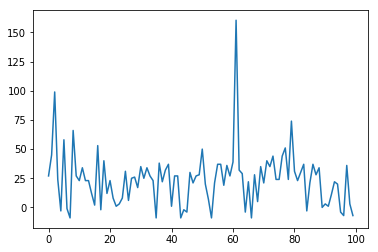

In [25]:
plt.plot(rtrace)

# IV - Results

- Describe the choice of your parameters for $\gamma$, $\alpha$, and $\epsilon$. 
  - Run experiments to find good parameters
  - Show the experimental outputs to show the process of your selection
- Visualize the results and explain outputs (even from mine.)
  - Run the codes and tell me what you observe
  - Add more visualizations to enrich your explanation.

### Utility functions for Plotting

- finish the TODOs here for plotting

In [71]:
### Plotting tools 

def plot_trace(agent, start, trace, title="test trajectory"):
    plt.plot(trace[:, 0], trace[:, 1], "ko-")
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.xlim([0, agent.size[1]])
    plt.ylim([0, agent.size[0]])
    

def plot_train(agent, rtrace, steps, trace, start):

    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(221)
    # TODO: plot rewards
    plt.plot(rtrace)
    
    plt.ylabel("sum of rewards")

    ax1 = fig.add_subplot(222)
    # TODO: plot steps
    plt.plot(steps)
    plt.ylabel("# steps")

    # contour plot for agent.Q
    ax2 = fig.add_subplot(223)
    xs = range(agent.size[1])
    ys = range(agent.size[0])
    maxQ = np.max(agent.Q, axis=2)
    h_b = (maxQ==-np.inf)
    maxQ[h_b] = 0
    maxQ[h_b] = np.min(maxQ) - 100
    cs = plt.contourf(xs, ys[::-1], maxQ)
    plt.colorbar(cs)
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.ylabel("max agent.Q")

    # plot traces
    ax3 = fig.add_subplot(224)
    plot_trace(agent, start, trace, "trace of the last episode")

    plt.plot()

# Maze Results

### Training and Testing with GridWorld

### Report the selected parameters

There are 5 parameters gamma, alpha, epsilon, maxiter, maxstep, I will change each one of them one by one five group of experiments, and check the result, based on below experiments. The parametes that I choose are: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=1000

### Experimental outputs that show the choice of parameters and how do you choose them

The design of five group of experiments and the conclusion of each group of experiments.

- Compare gamma = 0.1 with gamma = 0.99

    Experiment 1: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000
    
    Experiment 1*: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000
    
    Conclusion: gamma = 0.1 takes more steps, and the Q area becomes smaller, gamma = 0.99 is better.


 
 
- Comopare alpha=0.1 with alpha=0.9

    Experiment 2: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000
    
    Experiment 2*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000

    Conclusion: alpha=0.9 takes less steps, and the Q area is bigger, so alpha=0.9 is better




- Comopare epsilon=0.1 with epsilon=0.9

    Experiment 3: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000
    
    Experiment 3*: gamma = 0.99, alpha=0.9,epsilon=0.9,maxiter=100,maxstep=1000

    Conclusion: when epsilon = 0.9, it takes more steps, even though the Q area become bigger, epsilon=0.1 is better




- Comopare maxiter=100 with maxiter=1000

    Experiment 4: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000
    
    Experiment 4*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=1000

    Conclusion: when maxiter=1000, it achieve the goal with less steps, no big change of Q area, so maxiter=1000 is better.




- Comopare maxstep=1000 with maxstep=10000
    
    Experiment 5: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=1000
    
    Experiment 5*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=10000

    Conclusion: when maxstep=10000 it takes longer time, no improvement, so maxiter=1000 is better.

#### Experiment 1: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000

In [25]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.1, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

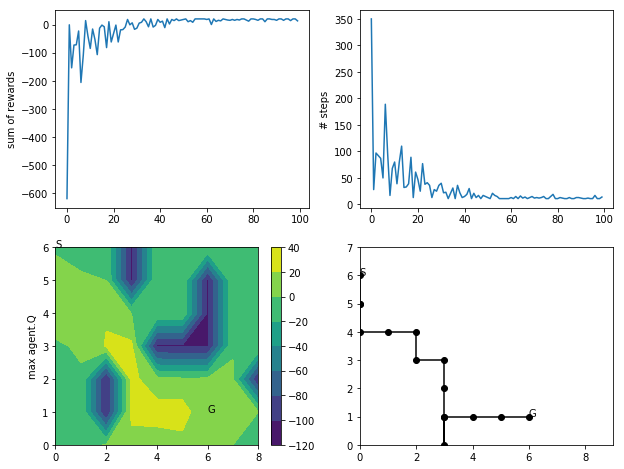

In [19]:
plot_train(agent, rtrace, steps, trace, start)

#### Experiment 1*: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000

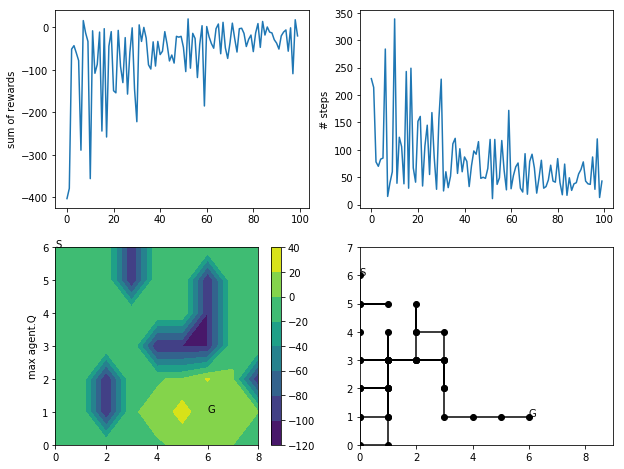

In [25]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.1, 
                                   alpha=0.1, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 2: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100,maxstep=1000

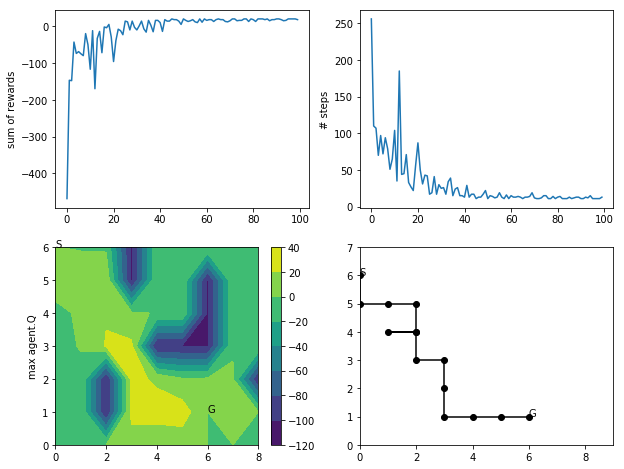

In [22]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.1, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 2*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000

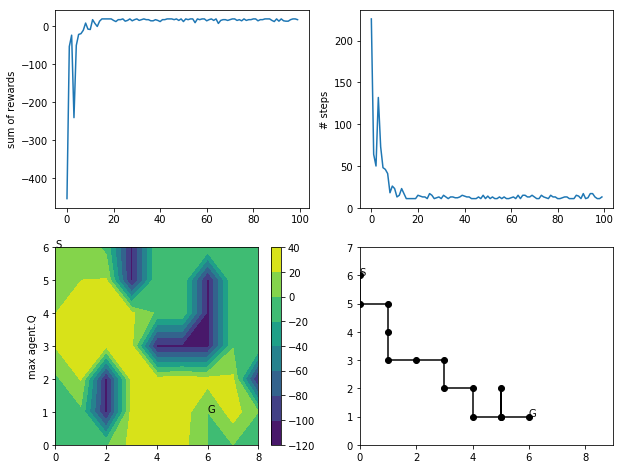

In [23]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 3: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000

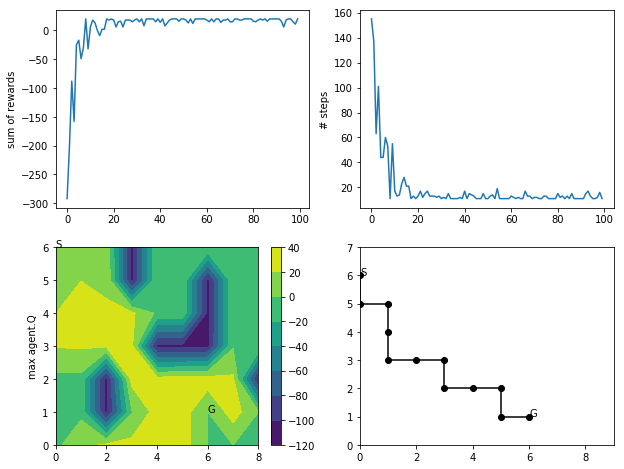

In [26]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 3*: gamma = 0.99, alpha=0.9,epsilon=0.9,maxiter=100,maxstep=1000

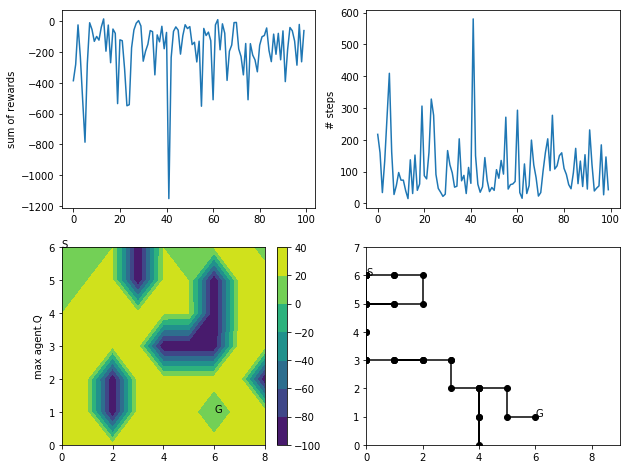

In [27]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.9, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 4: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=100,maxstep=1000

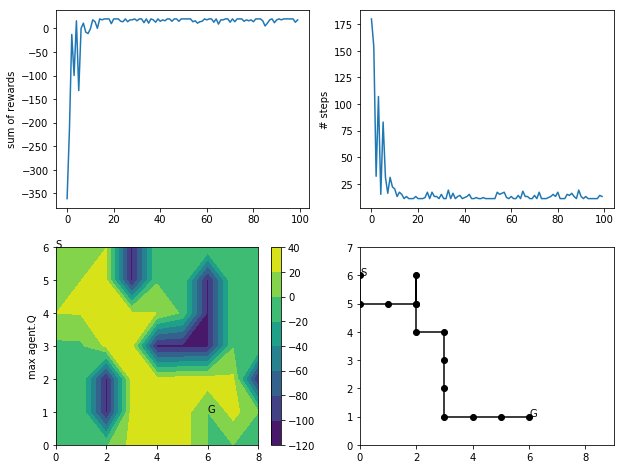

In [28]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

#### Experiment 4*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=1000

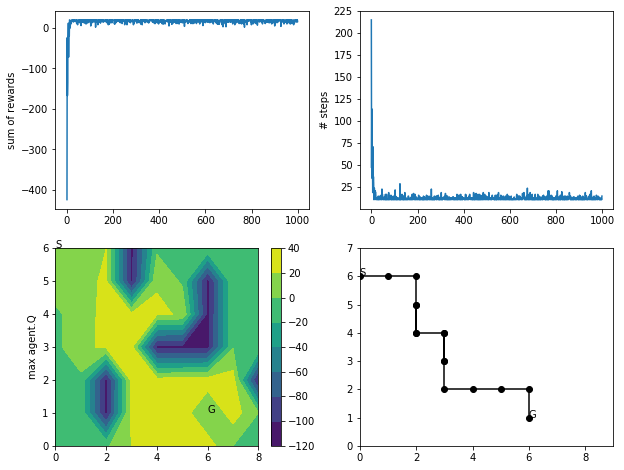

In [29]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=1000, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

Experiment 5: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=1000

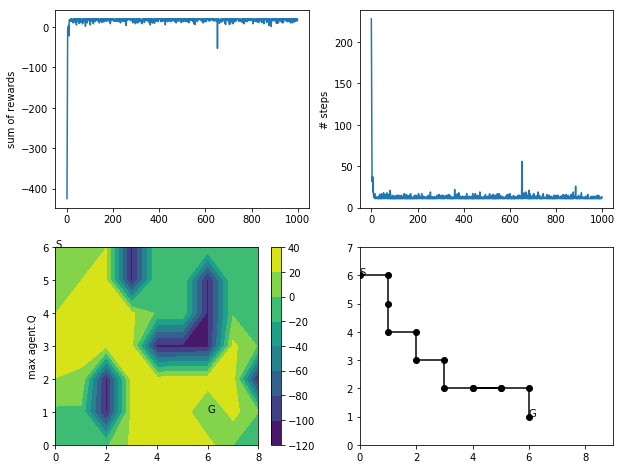

In [30]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=1000, 
                                   maxstep=1000)

plot_train(agent, rtrace, steps, trace, start)

Experiment 5*: gamma = 0.99, alpha=0.9,epsilon=0.1,maxiter=1000,maxstep=10000

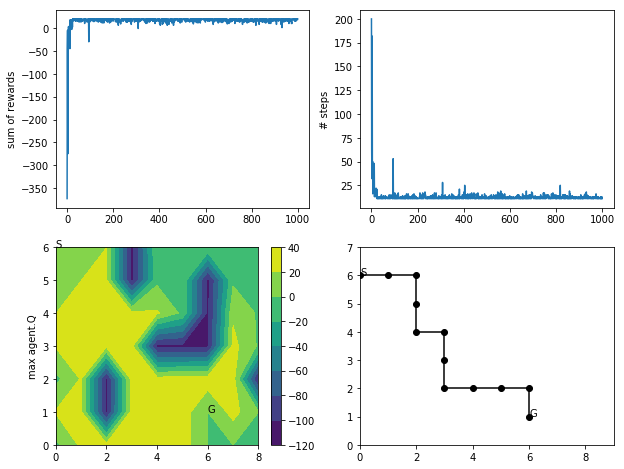

In [31]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.9, 
                                   epsilon=0.1, 
                                   maxiter=1000, 
                                   maxstep=10000)

plot_train(agent, rtrace, steps, trace, start)

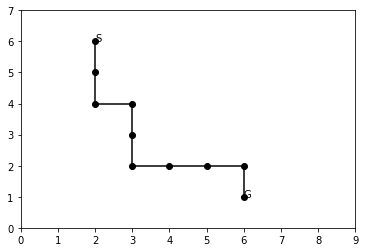

In [32]:
test_start = [0,2]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

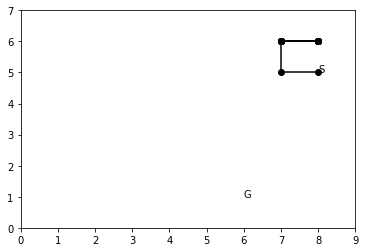

In [33]:
test_start = [1,8]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

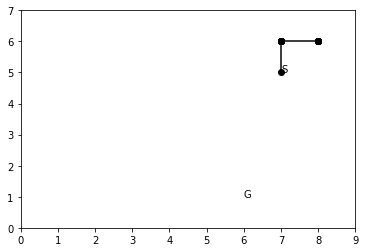

In [34]:
test_start = [1,7]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

### Reading and analysis of learning results and plots with Maze

For the maze problem

- We first choose the initial state is (0,0), and we change the values of the parameters, and we found that gamma = 0.99, alpha=0.9, epsilon=0.1, maxiter=1000, maxstep=1000 give us a comparatively good performance.


- When we set the initial state to (0,2), it also gives a comparatively good performance.


- However, when we set the initial state to (1,8), (1,7), it doesn't reach to the goal, which means the initial state is of importance too.

# Poker Results

### Reports the selected parameters

There are 4 parameters gamma, alpha, epsilon, maxiter, I will change each one of them one by one four group of experiments, and check the result, based on below experiments, the parameters that I choose is gamma = 0.1, alpha=0.1, 
epsilon = 0.1, maxiter=1000.

### Experimental outputs that show the choice of parameters and how do you choose them

The design of five group of experiments and the conclusion of each group of experiments.

- Compare gamma = 0.1 with gamma = 0.99

    Experiment 1: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100
    
    Experiment 1*: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100
    
    Conclusion: when gamma = 0.1, at certain round of game, the reward can achieve the highest value

 
 
- Comopare alpha=0.1 with alpha=0.9

    Experiment 2: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100
    
    Experiment 2*: gamma = 0.1, alpha=0.9,epsilon=0.1,maxiter=100

    Conclusion: when alpha=0.1, at certain round of game, the reward can achieve the highest value



- Comopare epsilon=0.1 with epsilon=0.9

    Experiment 3: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100
    
    Experiment 3*: gamma = 0.1, alpha=0.1,epsilon=0.9,maxiter=100

    Conclusion: when epsilon = 0.1,  at certain round of game, the reward can achieve the highest value



- Comopare maxiter=100 with maxiter=1000

    Experiment 4: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100
    
    Experiment 4*: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=1000

    Conclusion: when maxiter=1000, at certain round of game, the reward can achieve the highest value.



#### Experiment 1: gamma = 0.99, alpha=0.1,epsilon=0.1,maxiter=100

In [30]:
agent = RLAgent_Poker()
#start = {'other_stats': [[10, 1]], 'player_stats': [10, 1, 4], 'total_pot_balance': 2}
rtrace = agent.train(gamma=0.99,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)


New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 2)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[6, 4]], 'total_pot_balance': 7, 'player_stats': [13, 14, 3]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5, 1]], 'total_pot_balance': 2, 'player_stats': [10, 13, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer

Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[2.0, 3]], 'total_pot_balance': 7, 'player_stats': [11, 18, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 17, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 1]], 'total_pot_balance': 5, 'player_stats': [3, 19, 4]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats':

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 6, 'player_stats': [2, 12, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [2, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [2, 11, 1]}, -1, True)
**************************

Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 4, 'player_stats': [3, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 3, 'player_stats': [13, 10, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: com

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 6, 'player_stats': [7, 12, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [6, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 6), ('computer1', 10)]
Winner: computer
Print

Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[12.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 8, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 2)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_balance': 4, 'player_stats': [9, 10.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'pl

Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 10)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 9.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 7.0, 1]

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 7), ('computer1', 7)]
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 7)]
Printing winning players: Zoe computer1
Reward : 4.0
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 12.0, 4]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions fo

Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 8)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 6, 'player_stats': [5, 8, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Chec

Final Result: ({'other_stats': [[13.0, 1]], 'total_pot_balance': 4, 'player_stats': [6, 7.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 3]], 'total_pot_balance': 4, 'player_stats': [10, 6.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
compute

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [12, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 2]], 'total_pot_balance': 6, 'player_stats': [12, 13, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [3, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds

Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 3.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 4]], 'total_pot_balance': 5, 'player_stats': [2, 2.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions

#### Experiment 1*: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100

In [29]:
agent = RLAgent_Poker()
rtrace1 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 5)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 6, 'player_stats': [13, 13, 3]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [9, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, comp

Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[8.0, 1]], 'total_pot_balance': 3, 'player_stats': [4, 12.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [12, 11.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 10.0, 1]}
Available actions for: 

Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [8, 9.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [13, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0,

Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 4, 'player_stats': [6, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.

Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 5, 'player_stats': [7, 9, 3]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player act

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [4, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player ac

Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 7, 'player_stats': [9, 9.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 4, 'player_stats': 

Final Result: ({'other_stats': [[6.0, 4]], 'total_pot_balance': 8, 'player_stats': [11, 14.0, 4]}, 8.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 6)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[4.0, 2]], 'total_pot_balance': 4, 'player_stats': [11, 16.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 15.0, 1]}
Available act

Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 11.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 4, 'player_stats': [10, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 7, 'player_stats': [7, 13, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [2, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 2), ('computer1', 5)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[11.0, 4]], 'to

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 4), ('computer1', 4)]
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 4)]
Printing winning players: Zoe computer1
Reward : 4.0
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 12.0, 4]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: comp

Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 4), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[13.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 7, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 3]], 'total_pot_balance': 4, 'player_stats': [2, 6, 1]}, -1, True)
**************************************************
---

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 13), ('computer1', 10)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 4.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0]
Zoe folds


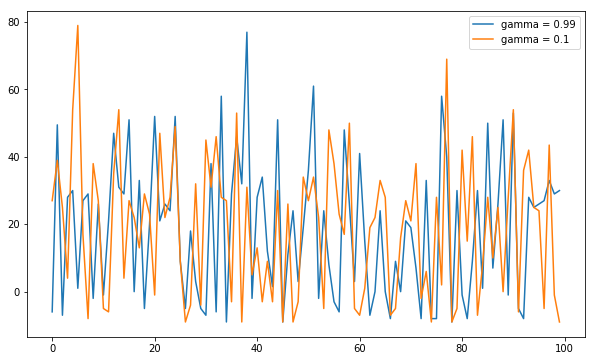

In [31]:
plt.figure(figsize=(10,6))
plt.plot(rtrace, label='gamma = 0.99')
plt.plot(rtrace1, label='gamma = 0.1')
plt.legend()
plt.show()

#### Experiment 2: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100

In [32]:
agent = RLAgent_Poker()
rtrace2 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [5, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 6, 'player_stats': [5, 12, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [8, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check res

Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 5, 'player_stats': [11, 12, 3]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [4, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 4), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 6, 'player_stats': [4, 9, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [1

Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 3]], 'total_pot_balance': 4, 'player_stats': [9, 12.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[7.0, 1]], 'total_pot_balance': 3, 'player_stats': [2, 13.0, 2]}, 3, True)
**************************************************
-------------------------

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 2), ('computer1', 4)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[18.0, 4]], 'total_pot_balance': 8, 'player_stats': [2, 2.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check re

Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 4.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[17.0, 2]], 'total_pot_balance': 3, 'player_stats': [7, 3.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 

Final Result: ({'other_stats': [[17.0, 3]], 'total_pot_balance': 6, 'player_stats': [4, 3, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 2, 1]}
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[19.0, 3]], 'total_pot_balance': 5, 'player_stats': [4, 1, 2]}, -2, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [7, 9, 1]}
Availa

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [3, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 3), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [3, 6, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: com

Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 6.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[13.0, 1]], 'total_pot_balance': 4, 'player_stats': [7, 7.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Availabl

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 3]], 'total_pot_balance': 4, 'player_stats': [10, 2.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 5)]
Printing winning players: Zoe co

Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 5, 'player_stats': [8, 11.0, 3]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winne

computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 9)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[17.0, 3]], 'total_pot_balance': 6, 'player_stats': [6, 3, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 2, 1]}
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[19.0, 3]], 'total_pot_balance': 5, 'player_stats': [13, 1, 2]}, -2, True)
**************************************

Final Result: ({'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 14.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 10)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 14.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Av

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 5)]
Printing winning players: Zoe computer1
Reward : 4.0
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 13.0, 4]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1

Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 4, 'player_stats': [2, 15.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 5, 'player_stats': [12, 13.0, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Availa

Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 3, 'player_stats': [10, 18.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 1]], 'total_pot_balance': 5, 'player_stats': [12, 19.0, 4]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions fo

#### Experiment 2*: gamma = 0.1, alpha=0.9,epsilon=0.1,maxiter=100

In [33]:
agent = RLAgent_Poker()
rtrace3 = agent.train(gamma=0.1,  
                     alpha=0.9,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [2, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 3, 'player_stats': [2, 11, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [9, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check res

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 6), ('computer1', 6)]
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 6)]
Printing winning players: Zoe computer1
Reward : 3.5
Final Result: ({'other_stats': [[8.5, 4]], 'total_pot_balance': 7, 'player_stats': [6, 11.5, 3]}, 3.5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.5, 1]], 'total_pot_balance': 2, 'player_stats': [9, 10.5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.5, 2]], 'total_pot_balance': 3, 'player_stats': [9, 10.5, 1]}, -1, True)
**************************************************
----------------------------------------

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[1, 1]], 'total_pot_balance': 4, 'player_stats': [8, 19, 3]}, 4, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 13), ('computer1', 9)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[6, 4]], 'total_pot_balance': 8, 'player_stats': [13, 14.0, 4]}, 8.0, True)
*

Final Result: ({'other_stats': [[13.0, 1]], 'total_pot_balance': 5, 'player_stats': [13, 7, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 5, 'player_stats': [11, 6, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 

Active player cards: [('Zoe', 11), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[13.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 7, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 7, 'player_stats': [10, 10, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal St

Reward : 5
Final Result: ({'other_stats': [[11.0, 1]], 'total_pot_balance': 5, 'player_stats': [7, 9.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 11), ('computer1', 7)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 12.0, 3]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'playe

Reward : 6
Final Result: ({'other_stats': [[10.5, 2]], 'total_pot_balance': 6, 'player_stats': [2, 9.5, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.5, 1]], 'total_pot_balance': 2, 'player_stats': [8, 8.5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 3)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[7.5, 3]], 'total_pot_balance': 6, 'player_stats': [8, 12.5, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.5, 1]], 'total_pot_balance': 2, 'player_stats': [12, 11.5, 1]}
Availabl

Reward : 5
Final Result: ({'other_stats': [[5, 1]], 'total_pot_balance': 5, 'player_stats': [13, 15, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4, 1]], 'total_pot_balance': 2, 'player_stats': [9, 14, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 8)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[1, 4]], 'total_pot_balance': 8, 'player_stats': [9, 19.0, 4]}, 8.0, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'tota

Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 2), ('computer1', 5)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 8, 'player_stats': [2, 9.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 5), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[14.0, 3]], 'total_pot_balance': 6, 'player_stats': [5, 6.0, 3

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 5, 'player_stats': [3, 11, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 11)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 11.0, 1]}, 1.0, True)
*****************************

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[18.0, 2]], 'total_pot_balance': 4, 'player_stats': [4, 2, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 1, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 5, 'player_stats': [13, 1, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can 

Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 2]], 'total_pot_balance': 6, 'player_stats': [8, 13, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [6, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 2]], 'total_pot_balance': 3, 'player_stats': [6, 12, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 11, 1]}
Available actions for: Zoe are [0, 1

**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [2, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 7, 'player_stats': [2, 13, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [2, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Availa

Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[3.0, 2]], 'total_pot_balance': 6, 'player_stats': [10, 17.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player activ

Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 4, 'player_stats': [10, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 7, 'player_stats': [5, 6, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available acti

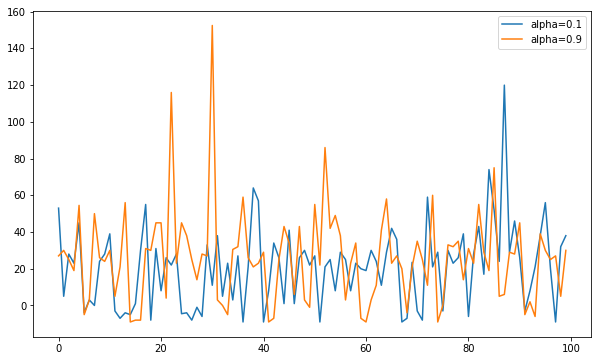

In [34]:
#plt.plot(rtrace3)

plt.figure(figsize=(10,6))
plt.plot(rtrace2, label='alpha=0.1')
plt.plot(rtrace3, label='alpha=0.9')
plt.legend()
plt.show()

#### Experiment 3: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100

In [42]:
agent = RLAgent_Poker()
rtrace4 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 5, 'player_stats': [6, 11, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [7, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 7), ('com

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_balance': 6, 'player_stats': [4, 10.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 3, 'player_stats': [8, 11.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot

Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [5, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [5, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning play

Active player cards: [('Zoe', 2), ('computer1', 12)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 8, 'player_stats': [2, 1.0, 4]}, -4, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [9, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [9, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 5)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 12.0, 4]}, 8.0, True)
**************************************************
--------------------------

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 8)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 6, 'player_stats': [6, 10.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 2), ('computer1', 9)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[13.

Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 5, 'player_stats': [5, 1, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [7, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 7), ('computer1'

Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 4, 'player_stats': [13, 9.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 2)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[17.0, 3]], 'total_pot_balance': 6, 'player_stats': [3, 3.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Play

Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 2)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 6, 'player_stats': [3, 9.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 4]], 'total_pot_balance': 5, 'player_stats': [5, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 7.0, 1]}
Ava

Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [8, 8, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[13.0, 2]], 'total_pot_balance': 3, 'player_stats': [8

Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 2)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 6, 'player_stats': [3, 10.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 3)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 6.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing win

#### Experiment 3*: gamma = 0.99, alpha=0.9,epsilon=0.9,maxiter=100

In [41]:
agent = RLAgent_Poker()
rtrace5 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.9,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 4, 'player_stats': [10, 11, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [8, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 11)]
Printing winning players: Zoe computer1
Reward : 3.0
Final Result: ({'other_stats': [[4.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 16.0, 3]}, 3.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
A

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 5, 'player_stats': [13, 8, 3]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe folds
Check 

Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 2]], 'total_pot_balance': 3, 'player_stats': [7, 6.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[15.0, 3]], 'total_pot_balance': 4,

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [9, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 5)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[5, 3]], 'total_pot_balance': 6, 'player_stats': [9, 15.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4, 1]], 'total_pot_balance': 2, 'player_stats': [2, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[8.0, 1]], 'total_pot_balance': 4, 'player_stats': [8, 12.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 11.0, 1]}, -1, True)
********************************

Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 5, 'player_stats': [3, 18.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_s

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[4.0, 2]], 'total_pot_balance': 6, 'player_stats': [13, 16.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 12)]
Printing winning players: compu

Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [5, 8, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[13.0, 2]], 'total_pot_balance': 3, 'player_stats': [13, 7, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats'

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 8, 'player_stats': [11, 4, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[18.0, 3]], 'total_pot_balance': 5, 'player_s

Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 5, 'player_stats': [5, 11, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [2, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[12.0, 4]], 'total_pot_balance': 7, 'player_stats': [2, 8, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 7, 1]}
Available actions 

Final Result: ({'other_stats': [[6.0, 3]], 'total_pot_balance': 4, 'player_stats': [8, 14, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 13, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 3, 'player_stats': [9, 15, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 14, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: compu

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 5)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 8, 'player_stats': [13, 13, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 6)]
Printing winning players: Zoe computer1
Reward :

Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 9)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[10.5, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9.5, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.5, 1]], 'total_pot_balance': 2, 'player_stats': [2, 8.5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[12.5, 4]], 'total_pot_balance': 6, 'player_stats': [2, 7.5, 2]}, -2, True)
**************************************************
------------------------------------

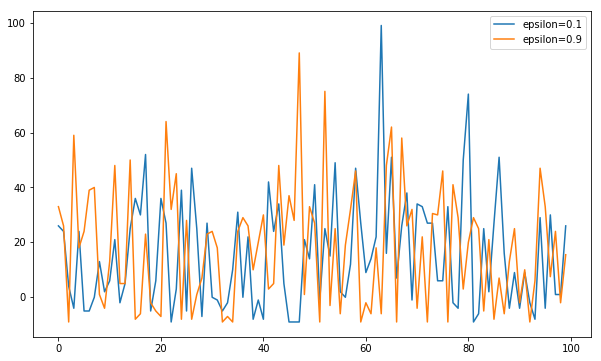

In [43]:
#plt.plot(rtrace5)

plt.figure(figsize=(10,6))
plt.plot(rtrace4, label='epsilon=0.1')
plt.plot(rtrace5, label='epsilon=0.9')
plt.legend()
plt.show()

#### Experiment 4: gamma = 0.1, alpha=0.1,epsilon=0.1,maxiter=100

In [44]:
agent = RLAgent_Poker()
rtrace6 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=100)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [9, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [9, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning p

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 6, 'player_stats': [13, 9.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays

Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 4, 'player_stats': [9, 10, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [9, 9, 1]}, -1, True)
**************************************************
----------------------

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 3), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[10.0, 4]], 'total_pot_balance': 7, 'player_stats': [3, 10.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 11), ('computer1', 7)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 13.0,

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 2)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 6, 'player_stats': [8, 13.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 5, 'player_stats'

Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 3]], 'total_pot_balance': 4, 'player_stats': [6, 2.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 2]], 'total_pot_balance': 3, 'player_stats': [11, 1.0, 

Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 8.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[13.0, 4]], 'total_pot_balance': 5, 'player_stats': [6, 7.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available 

computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 8)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 18.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 12), ('computer1', 12)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 18.0, 1]}, 1.0, True)
**************************************************
-------------------------

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[0.5, 1]], 'total_pot_balance': 3, 'player_stats': [3, 19.5, 2]}, 3, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [5, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 7)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10.0, 1]}, 1.0, True)
**************************************************
-----------------------------------

Reward : 5
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 5, 'player_stats': [4, 10.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 4, 'player_stats': [6, 9.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 

Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[3.0, 2]], 'total_pot_balance': 6, 'player_stats': [12, 17.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 3, 'player_stats': [13, 18.0, 2]}, 3, True)
**************************************************
------------------

Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 5, 'player_stats': [10, 12, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 4)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 12.0, 1]}, 1.0, True)
********************

#### Experiment 4*: gamma = 1, alpha=0.1,epsilon=0.1,maxiter=1000

In [45]:
agent = RLAgent_Poker()
rtrace7 = agent.train(gamma=0.1,  
                     alpha=0.1,
                     epsilon=0.1,  
                     maxiter=1000)

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[13.0, 4]], 'total_pot_balance': 7, 'player_stats': [6, 7, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 6, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Comput

Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [12, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 6, 'player_stats': [12, 12, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [3, 11, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
compu

Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 6), ('computer1', 6)]
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 6)]
Printing winning players: Zoe computer1
Reward : 3.0
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 6, 'player_stats': [6, 8.0, 3]}, 3.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Res

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 4, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 5, 'player_stats': [13, 4, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning player

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 6.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[11.0, 3]], 'total_pot_balance': 7, 'player_stats': [11, 9.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: 

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 8)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[7.0, 2]], 'total_pot_balance': 4, 'player_stats': [9, 13.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 2]], 'total_pot_balance': 3, 'player_stats'

Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 3)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 4, 'player_stats': [8, 12.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [6, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[7, 1]], 'total_pot_balance': 5, 'player_stats': [6, 13.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'playe

Active player cards: [('Zoe', 5), ('computer1', 4)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[6.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 14, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 13, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 4), ('computer1', 4)]
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 4)]
Printing winning players: Zoe computer1
Reward : 4.0
Final Result: ({'other_stats': [[6.0, 4]], 'total_pot_balance': 8, 'player_stats': [4,

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[1.0, 1]], 'total_pot_balance': 3, 'player_stats': [11, 19.0, 2]}, 3, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [2, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [2, 9, 1]}, -1, True)
**************************************************
------------------------------------------

Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 7, 'player_stats': [12, 1, 3]}, -3, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [12, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Com

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[16.0, 2]], 'total_pot_balance': 3, 'player_stats': [9, 4.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[17.0, 2]], 'total_pot_balance': 3, 'player_stats': [8, 3.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance

computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[4.0, 3]], 'total_pot_balance': 7, 'player_stats': [6, 16.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[2.0, 2]], 'total_pot_balance': 5, 'player_stats': [6, 18.0, 3]}, 5, True)
**************************************************
--------------------------------------------

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[8.0, 3]], 'total_pot_balance': 7, 'player_stats': [7, 12.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 3)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 3.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player act

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [9, 9.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1

Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 10)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 5.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Chec

Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [7, 9.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 2]], 'total_pot_balance': 3, 'player_stats': [9, 8.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_st

Reward : -1
Final Result: ({'other_stats': [[18.0, 3]], 'total_pot_balance': 4, 'player_stats': [11, 2.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 10)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[18.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 2.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available a

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 3), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [3, 6, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[15.0, 3]], 'total_pot_balance': 4, 'player_stats': [12, 5, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[14.0, 3]], 'total_pot_balance': 4, 'player_stats': [3, 6.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 5.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer 

Reward : 1.0
Final Result: ({'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 17.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 3, 'player_stats': [2, 18.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available ac

Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [9, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 3)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe pl

Reward : 4
Final Result: ({'other_stats': [[11.0, 1]], 'total_pot_balance': 4, 'player_stats': [13, 9, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 5, 'player_stats': [12, 10, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions 

Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 5, 'player_stats': [7, 15.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Re

Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 7, 'player_stats': [5, 13.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 8)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 13.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 12.0, 1]}
Available actions for:

Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 6)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[1.0, 4]], 'total_pot_balance': 7, 'player_stats': [13, 19.0, 3]}, 7, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [11, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11

Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[5.0, 2]], 'total_pot_balance': 6, 'player_stats': [9, 15.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Ch

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 2]], 'total_pot_balance': 6, 'player_stats': [6, 13, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [11, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[6, 1]], 'total_pot_balance': 5, 'player_stats': [11, 14, 4]}, 5, True)
****

**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 8)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[6, 4]], 'total_pot_balance': 8, 'player_stats': [13, 14, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5, 1]], 'total_pot_balance': 2, 'playe

Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 4)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[4.0, 3]], 'total_pot_balance': 6, 'player_stats': [10, 16.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Wi

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[8.0, 1]], 'total_pot_balance': 5, 'player_stats': [6, 12.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[6.0, 2]], 'total_pot_balance': 6, 'player_stats': [7, 14.0, 4]}, 6, True)
********************************************

computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 11), ('computer1', 7)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[3.0, 4]], 'total_pot_balance': 8, 'player_stats': [11, 17.0, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 4, 'playe

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 4)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 6, 'player_stats': [9, 13.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [12, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 12), ('computer1', 3)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[3, 4]], 'total_pot_balance': 7, 'player_stats': [12, 17.0, 3]}, 7, True)
************************

Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 4]], 'total_pot_balance': 5, 'player_stats': [9, 8, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 5), ('computer1', 3)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 12, 4]}, 8, True)
**************************************************
--------------------------------------------------


Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 5, 'player_stats': [2, 12.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 7), ('computer1', 4)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[3.0, 4]], 'total_pot_balance': 7, 'player_stats': [7, 17, 3]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 16, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[1.0, 2]], 'total_pot_balance': 6, 'player_stats': [5, 19, 4]}, 6, True)
**************************************************
Removing player: compute

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 10), ('computer1', 8)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[3.0, 3]], 'total_pot_balance': 6, 'player_stats': [10, 17.0, 3]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number:

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [10, 11.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 7)]
Printing winning 

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 4]], 'total_pot_balance': 5, 'player_stats': [12, 11, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_balance': 3, 'player_stats': [12, 10, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 9, 1]}
Available actions fo

computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[5.0, 3]], 'total_pot_balance': 7, 'player_stats': [2, 15.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 9)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 15.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 5)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[8, 2]], 'total_pot_balance': 4, 'player_stats': [11, 12.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7, 1]], 'total_pot_balance': 2, 'player_stats': [7, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[6, 2]], 'total_pot_balance': 6, 'player_stats': [7, 14.0, 4]}

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 4, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 5, 'player_stats': [7, 4, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_st

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 5, 'player_stats': [3, 11, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 5), ('computer1', 6)]
Winner: computer
Printing 

Active player cards: [('Zoe', 10), ('computer1', 8)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[1.0, 4]], 'total_pot_balance': 8, 'player_stats': [10, 19.0, 4]}, 8.0, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 10), ('computer1', 6)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[6, 4]], 'total_pot_balance': 7, 'player_stats': [10, 14, 3]}, 7, True)
**************************************

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 10)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 5.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[17.0, 4]], 'total_pot_balance': 6, 'pl

Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 3, 'player_stats': [10, 11.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_balance': 3, 'player_stats': [3, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available act

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 4, 'player_stats': [9, 11, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [2, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 2]], 'total_pot_

Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 12)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 13.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats'

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 5), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 5, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 4, 1]}
Available actions for: Zoe are [0, 1,

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 4, 'player_stats': [7, 10, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 5, 'player_stats': [4, 11, 4]}, 5, True)
**************************************************
-----------------------------------------

Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[7.0, 2]], 'total_pot_balance': 4, 'player_stats': [3, 13, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 6), ('computer1', 5)]
Wi

Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 4, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 2)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 5.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 2)]
Printing winning play

Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [10, 11.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 11), ('computer1', 

Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[2.0, 1]], 'total_pot_balance': 5, 'player_stats': [5, 18.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [6, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 6)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 13.0, 4]}, 8.0, True)
**************************************************
------------------------------

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 1]], 'total_pot_balance': 5, 'player_stats': [10, 19.0, 4]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [8, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 8), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[13.0, 3]], 'total_pot_balance': 6, 'player_stats': [8, 7, 3]}, -3, True)
****

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[12.0, 3]], 'total_pot_balance': 6, 'player_stats': [9, 8.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[11.0, 1]], 'total_pot_ba

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 2]], 'total_pot_balance': 5, 'player_stats': [4, 19.0, 3]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [3, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [3, 6, 4]}, -4, True)
****************************************

computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 11), ('computer1', 2)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[2, 4]], 'total_pot_balance': 8, 'player_stats': [11, 18.0, 4]}, 8.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1, 1]], 'total_pot_balance': 2, 'player_stats': [6, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1, 1]], 'total_pot_balance': 5, 'player_stats': [6, 19.0, 4]}, 5, True)
**************************************************
Removin

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 5, 'player_stats': [3, 4.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'ot

Active player cards: [('Zoe', 7), ('computer1', 6)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 15.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[6.0, 4]], 'total_pot_balance': 5, 'player_stats': [5, 14.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 13.0, 1]}
Availa

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 3]], 'total_pot_balance': 4, 'player_stats': [9, 1.0, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Co

Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 8)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 4.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
F

computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 4), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 1, 4]}, -4, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [4, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[7,

Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[9.0, 2]], 'total_pot_balance': 3, 'player_stats': [8, 11.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 6)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 11.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 10.0, 1]}
Available acti

Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [8, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 5, 'player_stats': [8, 11, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [2, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_bal

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 5)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[7.0, 4]], 'total_pot_balance': 8, 'player_stats': [9, 13.0, 4]}, 8, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 10)]
Printing winning players: Zoe computer1
Rewar

Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 6), ('computer1', 7)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 3.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 2.0, 1]}
Available actions for: Zoe are [0, 1]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats':

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 7, 'player_stats': [6, 1.0, 3]}, -3, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [7, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Co

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 12)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[5.5, 4]], 'total_pot_balance': 7, 'player_stats': [13, 14.5, 3]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.5, 1]], 'total_pot_balance': 2, 'player_stats': [4, 13.5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: play

Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[16.0, 2]], 'total_pot_balance': 4, 'player_stats': [8, 4, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[17.0, 2]], 'total_pot_balance': 3, 'player_stats': [11, 3, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 

Active player cards: [('Zoe', 10), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 8, 'player_stats': [10, 4, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 3, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[17.0, 3]], 'total_pot_balance': 4, 'player_stats': [12, 3, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[16.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 2, 1]}
A

Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[3.0, 1]], 'total_pot_balance': 4, 'player_stats': [11, 17.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 2]], 'total_pot_balance': 5, 'player_stats': [8, 19.0, 3]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient funds !!
New Episode
--------------------------------------------------
Deal Start!
Start State:

Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 10.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 13), ('computer1', 12)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[8.0, 2]], 'total_pot_balance': 4, 'player_stats': [13, 12.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_bal

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[8.0, 1]], 'total_pot_balance': 5, 'player_stats': [2, 12.0, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active 

Active player cards: [('Zoe', 4), ('computer1', 6)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 6, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 6)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[10.0, 4]], 'total_pot_balance': 7, 'player_stats': [9, 10, 3]}, 7, True)
**************************************************
--------------------------------------------------
D

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 5), ('computer1', 6)]
Winner: computer
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [5, 5, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 4, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[14.0, 1]], 'total_pot_balance': 5, 'player_stats': [8, 6, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
St

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 2]], 'total_pot_balance': 3, 'player_stats': [11, 2, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 1, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 3]], 'total_pot_balance': 4, 'player_stats': [10, 1, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal S

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 13), ('computer1', 5)]
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[3.0, 4]], 'total_pot_balance': 7, 'player_stats': [13, 17.0, 3]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[4.0, 2]], 'total_pot_balance': 3, 'player_stats': [10, 16.0, 1]}, -1, True)
***

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 5)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 15.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[3.0, 2]], 'total_pot_balance': 6, 'player_stats': [1

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[9, 1]], 'total_pot_balance': 3, 'player_stats': [13, 11, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8, 1]], 'total_pot_balance': 2, 'player_stats': [3, 10, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Rewar

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [2, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 5, 'player_stats': [2, 10, 4]}, 5, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats':

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[4.0, 2]], 'total_pot_balance': 3, 'player_stats': [6, 16, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 15, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[3.0, 1]], 'total_pot_balance': 4, 'player_stats': [2, 17, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[

Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 8.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 9)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [7, 5.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Z

Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 10), ('computer1', 8)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 11.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 4, 'player_stats': [7, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Zoe are [0, 1]
Zoe plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 10), ('computer1', 9)]
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 6, 'player_stats': [10, 13, 3]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [5, 12, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_bala

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 4), ('computer1', 12)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[10.0, 4]], 'total_pot_balance': 8, 'player_stats': [4, 10.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [6, 9.0, 1]}, -1, True)
**************************************************
-------------------------------------------

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 4]], 'total_pot_balance': 5, 'player_stats': [4, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer 

Final Result: ({'other_stats': [[13.0, 3]], 'total_pot_balance': 4, 'player_stats': [9, 7.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[12.0, 1]], 'total_pot_balance': 2, 'player_stats': [10, 6.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[12.0, 1]], 'total_pot_balance': 3, 'player_stats': [10, 8.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 7.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions

Final Result: ({'other_stats': [[10.0, 2]], 'total_pot_balance': 3, 'player_stats': [4, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 3
Final Result: ({'other_stats': [[9.0, 1]], 'total_pot_balance': 3, 'player_stats': [13, 11.0, 2]}, 3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions 

Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 12), ('computer1', 9)]
Printing winning players: Zoe
Reward : 8.0
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [12, 12.0, 4]}, 8.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 4)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[7, 3]], 'total_pot_balance': 6, 'player_stats': [9, 13.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6, 1]], 'total_pot_balance': 2, 'player_stats': [2, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 5, 'player_stats': [2, 12.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
D

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2, 1]], 'total_pot_balance': 2, 'player_stats': [13, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 4
Final Result: ({'other_stats': [[2, 1]], 'total_pot_balance': 4, 'player_stats': [13, 18.0, 3]}, 4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[1, 1]], 'total_pot_balance': 2, 'player_stats': [13, 17.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
C

**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[8.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 10.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[10.0, 3]], 'total_pot_balance': 4, 'player_stats': [8, 10.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0, 2]
Zoe plays 1.
Check results for Round Number: 2
Computer

Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 2), ('computer1', 8)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 8, 'player_stats': [2, 5.0, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 4.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[14.0, 1

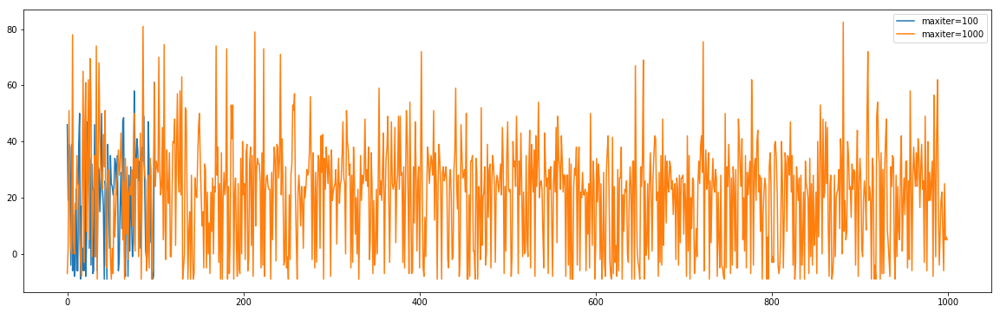

In [47]:
#plt.plot(rtrace7)

plt.figure(figsize=(20,6))
plt.plot(rtrace6, label='maxiter=100')
plt.plot(rtrace7, label='maxiter=1000')
plt.legend()
plt.show()

In [55]:
agent = RLAgent_Poker()

test_trace = agent.test()

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [5, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 5), ('computer1', 3)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 10.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
co

Active player cards: [('Zoe', 11), ('computer1', 3)]
Printing winning players: Zoe
Reward : 6.0
Final Result: ({'other_stats': [[4.0, 3]], 'total_pot_balance': 6, 'player_stats': [11, 16.0, 3]}, 6.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[3.0, 1]], 'total_pot_balance': 2, 'player_stats': [6, 15.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[5.0, 3]], 'total_pot_balance': 4, 'player_stats': [6, 15.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [11, 14.0, 1]}
Available action

Reward : -3
Final Result: ({'other_stats': [[16.0, 4]], 'total_pot_balance': 7, 'player_stats': [8, 4.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 3.0, 1]}
Available actions for: Zoe are [0, 1, 2]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Zoe are [0]
Zoe folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[18.0, 4]], 'total_pot_balance': 6, 'player_stats': [2, 2.0, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available 

Active player cards: [('Zoe', 9), ('computer1', 9)]
Printing winning players: Zoe computer1
Reward : 4.0
Final Result: ({'other_stats': [[8.0, 4]], 'total_pot_balance': 8, 'player_stats': [9, 12.0, 4]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[7.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 11.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 7), ('computer1', 2)]
Printing winning players: Zoe
Reward : 4.0
Final Result: ({'other_stats': [[6.0, 2]], 'total_pot_balance': 4, 'player_stats': [7, 14.0, 2]}, 4.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start S

Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 2]], 'total_pot_balance': 3, 'player_stats': [2, 2, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [4, 1, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 4]], 'total_pot_balance': 5, 'player_stats': [4, 1, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [10

Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [5, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 2]], 'total_pot_balance': 3, 'player_stats': [5, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [8, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player activ

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[6.0, 3]], 'total_pot_balance': 4, 'player_stats': [9, 14.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[5.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 13.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Zoe', 9), ('computer1', 5)]
Winner: player
Printing winning players: Zoe
Reward : 8
Final Result: ({'other_stats': [[2.0, 4]], 'total_p

Winner: computer
Printing winning players: computer1
Reward : -2
Final Result: ({'other_stats': [[15.0, 4]], 'total_pot_balance': 6, 'player_stats': [10, 5, 2]}, -2, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 4, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Zoe', 9), ('computer1', 12)]
Printing winning players: Zoe computer1
Reward : 1.0
Final Result: ({'other_stats': [[15.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 5.0, 1]}, 1.0, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[14.0, 1]], 'total_pot_balance': 2, 'player_stats': [3, 4.0, 1]}

computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 7
Final Result: ({'other_stats': [[3.0, 3]], 'total_pot_balance': 7, 'player_stats': [6, 17.0, 4]}, 7, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[2.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 16.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[1.0, 2]], 'total_pot_balance': 5, 'player_stats': [5, 19.0, 3]}, 5, True)
**************************************************
Removing player: computer1 due to insufficient 

Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[18.0, 4]], 'total_pot_balance': 5, 'player_stats': [13, 2.0, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[17.0, 1]], 'total_pot_balance': 2, 'player_stats': [2, 1.0, 1]}
Available actions for: Zoe are [0]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[19.0, 3]], 'total_pot_balance': 4, 'player_stats': [2, 1.0, 1]}, -1, True)
**************************************************
Player doesnt have balance !
Zoe can no longer play the game !
New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stat

New Episode
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1]], 'total_pot_balance': 2, 'player_stats': [8, 9, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 8), ('computer1', 9)]
Printing winning players: computer1
Reward : -4
Final Result: ({'other_stats': [[14.0, 4]], 'total_pot_balance': 8, 'player_stats': [8, 6, 4]}, -4, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[13.0, 1]], 'total_pot_balance': 2, 'player_stats': [9, 5, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer acti

Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[11.0, 4]], 'total_pot_balance': 5, 'player_stats': [6, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[10.0, 1]], 'total_pot_balance': 2, 'player_stats': [13, 8, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 4]], 'total_pot_balance': 5, 'player_stats': [13, 8, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1]], 'total_pot_balance': 2, 'player_stats': [5, 7, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays

Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 6
Final Result: ({'other_stats': [[5.0, 2]], 'total_pot_balance': 6, 'player_stats': [7, 15.0, 4]}, 6, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[4.0, 1]], 'total_pot_balance': 2, 'player_stats': [7, 14.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[6.0, 3]], 'total_pot_balance': 4, 'player_stats': [7, 14.0, 1]}, -1, True)
****************

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Zoe', 3), ('computer1', 10)]
Printing winning players: computer1
Reward : -3
Final Result: ({'other_stats': [[7.0, 3]], 'total_pot_balance': 6, 'player_stats': [3, 13.0, 3]}, -3, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[6.0, 1]], 'total_pot_balance': 2, 'player_stats': [12, 12.0, 1]}
Available actions for: Zoe are [0, 1, 2, 3]
Zoe plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Zoe
Reward : 5
Final Result: ({'other_stats': [[6.0, 1]], 'total_pot_balance': 5, 'player_stats': [12, 14.0, 4]}, 5, True)
**************************************************
------

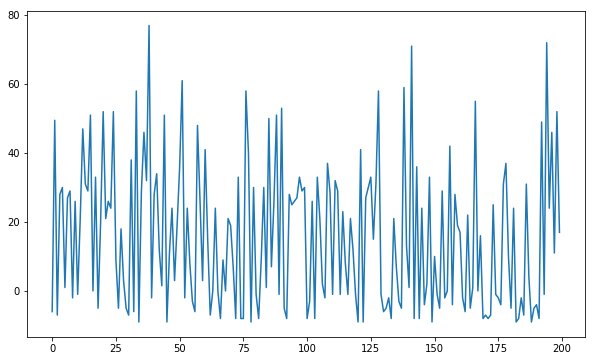

In [57]:
plt.figure(figsize=(10,6))
plt.plot(test_trace)

### Reading and analysis of learning results and plots with Poker

For the Poker

- Based on reinforcement learning, the player can enhance the probability of winning the game.

- From what I have observed, when we choose gamma = 0.1, alpha=0.1, epsilon=0.1, and maxiter = 1000, the player can get the highest score in certain round of games.

- From what I have observed, even raise the the number of maximum iteration, the player still lose in certain round of games.

# V. Conclusions

Discuss the challenges or somethat that you learned. 
If you have any suggestion about the assignment, you can write about it. 

In this assignment

- I have learnt how to apply reinforment learning into practice.

- I have practiced on how to choose between Q-learning and SARSA.

- Finally, I leant how to compare the experiments to find the better performance parameters.

# Extra Credit

- Let us have Poker Tournament in class (Nov 6th.)!
- Top 4 (or more) students will get an extra credit. 
- 2 (or more?) unique training attemps will also get an extra credit. (Sales for it to be considered.) 

## Grading

We will test your notebook with an additional grid.txt file. Please make sure to test in different maze input files. 

points | | description
--|--|:--
5 | Overview| states the objective and the appraoch 
10 | Maze Problem | 
 | 5| Includes description of maze problem
 | 5| Explains the GridWorld
10 | Poker 
 | 5| Includes description of poker problem
 | 5| Explains the Poker
25 | Methods | 
 | 5| Review of the SARSA and Q-Learning
 | 5| Choice of TD learning and Reason
 |10| Implementation of the selected approach
 | 5| explanation of the codes
45 | Results 
| 5| Reports the selected parameters for both problems. 
|20| Experimental outputs that show the choice of parameters. How do you choose them? (10 points per each problem)
|10| Output plots (5 for each)
|10| reading and analysis of learning results and plots (5 for each)
5 | Conclusions 
